In [1]:
#pip install numpy==1.20.0 --user


In [2]:
 #pip install --upgrade pandas --user

In [3]:
#pip install numba==0.53.0


In [4]:
import numpy as np
import pandas as pd
#import matplotlib.pyplot as plt
#%matplotlib inline

# Lectura de datos

In [5]:
X_t0_path = "X_t0.parquet"
y_t0_path = "y_t0.parquet"
X_t1_path = "X_t1.parquet"
y_t1_path = "y_t1.parquet"
X_t2_path = "X_t2.parquet"
X_t0 = pd.read_parquet(X_t0_path)
y_t0 = pd.read_parquet(y_t0_path)
X_t1 = pd.read_parquet(X_t1_path)
y_t1 = pd.read_parquet(y_t1_path)
X_t2 = pd.read_parquet(X_t2_path)

In [6]:
#from ydata_profiling import ProfileReport
#
#profile = ProfileReport(X_t1, title="X_t1 Profiling Report", minimal=True)
#profile.to_file("X_t1_profiling_report.html")


# EDA

## Tiempo

Las unidades de tiempo están en unix y se pasarán a dias. Por otro lado existen unidades de tiempo con valor 999999999, esto no debería pasar por lo que se reemplazaran

In [7]:
#!pip install nbformat

In [8]:
import plotly.express as px

fig = px.histogram(X_t1, x="risky_first_tx_timestamp", nbins=100)
fig.show()

In [9]:
def replace_first_tx(df):
    mask = df['risky_first_tx_timestamp'] == 999999999
    df.loc[mask, 'risky_first_tx_timestamp'] = df.loc[mask, 'first_tx_timestamp']
    return df

def categorical_replace_first_tx(df, replace_value=0):
    df['has_risky_first_tx'] = df['risky_first_tx_timestamp'] != 999999999
    df['risky_first_tx_timestamp'] = df['risky_first_tx_timestamp'].replace(999999999, replace_value)
    return df

X_t1 = categorical_replace_first_tx(X_t1, np.nan)
X_t2 = categorical_replace_first_tx(X_t2, np.nan)

valor_maximo = X_t1['risky_first_tx_timestamp'].max()
valor_minimo = X_t1['risky_first_tx_timestamp'].min()

print("El valor máximo es:", valor_maximo)
print("El valor mínimo es:", valor_minimo)

El valor máximo es: 1619638713.0
El valor mínimo es: 1591229338.0


In [10]:
fig = px.histogram(X_t1, x="risky_first_tx_timestamp", nbins=100)
fig.show()

In [11]:
def replace_last_tx(df):
    mask = df['risky_last_tx_timestamp'] == 999999999
    df.loc[mask, 'risky_last_tx_timestamp'] = df.loc[mask, 'last_tx_timestamp']
    return df

def categorical_replace_last_tx(df, replace_value=0):
    df['has_risky_last_tx'] = df['risky_last_tx_timestamp'] != 999999999
    df['risky_last_tx_timestamp'] = df['risky_last_tx_timestamp'].replace(999999999, replace_value)
    return df

X_t1 = categorical_replace_last_tx(X_t1, np.nan)
X_t2 = categorical_replace_last_tx(X_t2, np.nan)

valor_maximo = X_t1['risky_last_tx_timestamp'].max()
valor_minimo = X_t1['risky_last_tx_timestamp'].min()

print("El valor máximo es:", valor_maximo)
print("El valor mínimo es:", valor_minimo)

El valor máximo es: 1619643423.0
El valor mínimo es: 1591262954.0


In [12]:
fig = px.histogram(X_t1, x="risky_last_tx_timestamp", nbins=100)
fig.show()

In [13]:
valor_maximo = X_t1['time_since_last_liquidated'].max()
valor_minimo = X_t1['time_since_last_liquidated'].min()

print("El valor máximo es:", valor_maximo)
print("El valor mínimo es:", valor_minimo)

El valor máximo es: 999999999.0
El valor mínimo es: 56.0


In [14]:
fig = px.histogram(X_t1, x="time_since_last_liquidated", nbins=100)
fig.show()

In [15]:
def replace_time_since_last_liquidated(df):    
    df.loc[df['time_since_last_liquidated'] == 999999999, 'time_since_last_liquidated'] = 0
    df['time_since_last_liquidated'] = df['time_since_last_liquidated'] /86400
    return df

def categorical_replace_time_since_last_liquidated(df, replace_value=0):
    df['has_time_since_last_liquidated'] = df['time_since_last_liquidated'] != 999999999
    df['time_since_last_liquidated'] = df['time_since_last_liquidated'].replace(999999999, replace_value)
    return df

X_t1 = categorical_replace_time_since_last_liquidated(X_t1, np.nan)
X_t2 = categorical_replace_time_since_last_liquidated(X_t2, np.nan)
valor_maximo = X_t1['time_since_last_liquidated'].max()
valor_minimo = X_t1['time_since_last_liquidated'].min()

print("El valor máximo es:", valor_maximo)
print("El valor mínimo es:", valor_minimo)


El valor máximo es: 55085292.0
El valor mínimo es: 56.0


In [16]:
fig = px.histogram(X_t1, x="time_since_last_liquidated", nbins=100)
fig.show()

# Join datasets

In [17]:
X_t1 = X_t1.reset_index(drop=True)
X_t2 = X_t2.reset_index(drop=True)
final_df = X_t1.join(y_t1)
final_df


,borrow_block_number,borrow_timestamp,wallet_address,first_tx_timestamp,last_tx_timestamp,wallet_age,incoming_tx_count,outgoing_tx_count,net_incoming_tx_count,total_gas_paid_eth,...,market_plus_dm,market_ppo,market_rocp,market_rocr,unique_borrow_protocol_count,unique_lending_protocol_count,has_risky_first_tx,has_risky_last_tx,has_time_since_last_liquidated,target
0,10336632,1.593110e+09,0x585bb700e2cdb34e8857bcf156df116636992825,1.551772e+09,1.593110e+09,41337993.0,12,14,-2,0.015177,...,24.502158,-1.672639,0.007081,1.007081,0,0,True,True,False,0.0
0,10336632,1.593110e+09,0x585bb700e2cdb34e8857bcf156df116636992825,1.551772e+09,1.593110e+09,41337993.0,12,14,-2,0.015177,...,24.502158,-1.672639,0.007081,1.007081,0,0,True,True,False,0.0
1,10336644,1.593110e+09,0x2d0b0664d55ddc851561678bbe97d538ae78ed72,1.565473e+09,1.593110e+09,27637657.0,189,217,-28,1.162723,...,24.502158,-1.672639,0.007081,1.007081,1,1,True,True,False,0.0
1,10336644,1.593110e+09,0x2d0b0664d55ddc851561678bbe97d538ae78ed72,1.565473e+09,1.593110e+09,27637657.0,189,217,-28,1.162723,...,24.502158,-1.672639,0.007081,1.007081,1,1,True,True,False,1.0
2,10336670,1.593111e+09,0x25f810cd651e4de4814f519a0ad27c5e7a50338d,1.496321e+09,1.593106e+09,96789742.0,27,32,-5,0.270085,...,24.502158,-1.672639,0.007081,1.007081,1,1,True,True,False,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
132883,12331266,1.619644e+09,0x9e653cdedb19674cbe557ac4af6a350001da2688,1.457311e+09,1.619578e+09,162332619.0,228,260,-32,4.421527,...,818.145830,4.748082,0.135601,1.135601,1,1,True,True,False,NaN
132884,12331273,1.619644e+09,0x79a323f3e256354dd7dc73b001ba2167ff1fd9f8,1.617225e+09,1.619644e+09,2419145.0,9,7,2,0.220708,...,818.145830,4.748082,0.135601,1.135601,1,1,False,False,False,NaN
132885,12331278,1.619644e+09,0x597568694fe6ee1b701ec8578bd57102c9a29abd,1.598065e+09,1.619632e+09,21579231.0,432,608,-176,16.245965,...,818.145830,4.748082,0.135601,1.135601,2,2,True,True,False,NaN
132886,12331297,1.619645e+09,0x741d5aa0e25b6f94ca93c35b85ebd5b4bad00a8c,1.594107e+09,1.619630e+09,25537329.0,483,579,-96,10.114248,...,818.145830,4.748082,0.135601,1.135601,2,2,True,True,True,NaN


In [18]:
X_t1 = X_t1.drop(columns=['wallet_address'])
X_t2 = X_t2.drop(columns=['wallet_address'])
X_t1['has_risky_first_tx'] = X_t1['has_risky_first_tx'].astype(int)
X_t1['has_risky_last_tx'] = X_t1['has_risky_last_tx'].astype(int)
X_t1['has_time_since_last_liquidated'] = X_t1['has_time_since_last_liquidated'].astype(int)
X_t2['has_risky_first_tx'] = X_t2['has_risky_first_tx'].astype(int)
X_t2['has_risky_last_tx'] = X_t2['has_risky_last_tx'].astype(int)
X_t2['has_time_since_last_liquidated'] = X_t2['has_time_since_last_liquidated'].astype(int)

In [19]:
assert X_t1.shape[1] == X_t2.shape[1]

In [20]:
y_t1['target'].value_counts()

target
0    82645
1    50243
Name: count, dtype: int64

In [21]:
X_t1.dtypes.value_counts()

float64    62
int64      17
Name: count, dtype: int64

In [22]:
X_t2.dtypes.value_counts()

float64    62
int64      17
Name: count, dtype: int64

# Modelos


## Baseline

In [23]:
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.metrics import auc, classification_report, confusion_matrix, precision_recall_curve, roc_curve
import numpy as np
import xgboost as xgb

X_train, X_test, y_train, y_test = train_test_split(X_t1, y_t1, test_size=0.3, random_state=1451)

model = xgb.XGBClassifier(objective='binary:logistic',eval_metric='aucpr', random_state=100)
model.fit(X_train, y_train)

y_probs = model.predict_proba(X_test)[:, 1]

fpr, tpr, thresholds = roc_curve(y_test, y_probs)
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]
y_pred_adjusted = (y_probs > optimal_threshold).astype(int)

precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
auc_pr = auc(recall, precision)
print("AUCPR:", auc_pr)


print("Informe de clasificación con umbral ajustado:\n", classification_report(y_test, y_pred_adjusted))

from sklearn.metrics import confusion_matrix
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred_adjusted))


AUCPR: 0.9093472233489006
Informe de clasificación con umbral ajustado:
               precision    recall  f1-score   support

           0       0.88      0.90      0.89     24892
           1       0.83      0.79      0.81     14975

    accuracy                           0.86     39867
   macro avg       0.85      0.85      0.85     39867
weighted avg       0.86      0.86      0.86     39867

Matriz de confusión:
 [[22450  2442]
 [ 3139 11836]]


Baseline best result: 0.9093472233489006

## ELIMINACION DE VARIABLES

### Outliers

In [24]:
from scipy.stats.mstats import winsorize
num_columns = X_t1.select_dtypes(include=['float64', 'int64']).columns

def filter_outliers_iqr(col):
    Q1 = col.quantile(0.1)
    Q3 = col.quantile(0.9)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return col[(col < lower_bound) | (col > upper_bound)]

def filter_outliers_zscore(col, threshold=3):
    z_scores = (col - col.mean()) / col.std()
    return col[abs(z_scores) > threshold]

def clean_df_iqr(df):    
    outlier_vars = {}
    for col in num_columns:
        outliers = filter_outliers_iqr(df[col])
        if not outliers.empty:
            outlier_vars[col] = len(outliers)

    for col in outlier_vars.keys():
        df[col] = winsorize(df[col], limits=[0.01, 0.01]) 

    return df

def clean_df_zscore(df, threshold=3):
    outlier_vars = {}
    for col in num_columns:
        outliers = filter_outliers_zscore(df[col], threshold)
        if not outliers.empty:
            outlier_vars[col] = len(outliers)

    for col in outlier_vars.keys():
        df[col] = winsorize(df[col], limits=[0.01, 0.01]) 

    return df

X_t1_cleaned = clean_df_zscore(X_t1)

### Poca varianza

In [25]:
for col in X_t1.columns:
    if pd.api.types.is_numeric_dtype(X_t1[col]):
        variance = X_t1[col].var()
        print(f"Variance of column {col}: {variance}")
    else:
        print(f"Column {col} is not numeric, cannot calculate variance.")

Variance of column borrow_block_number: 347212905238.6355
Variance of column borrow_timestamp: 61351484624636.24
Variance of column first_tx_timestamp: 1297436331207065.8
Variance of column last_tx_timestamp: 61121107168640.375
Variance of column wallet_age: 1250404077165595.2
Variance of column incoming_tx_count: 2342343.4074888215
Variance of column outgoing_tx_count: 4770210.697822376
Variance of column net_incoming_tx_count: 357892.5606875026
Variance of column total_gas_paid_eth: 1815.3255579047348
Variance of column avg_gas_paid_per_tx_eth: 0.00029802677831558885
Variance of column risky_tx_count: 45581.20249810576
Variance of column risky_unique_contract_count: 668.5203283006457
Variance of column risky_first_tx_timestamp: 54343642291242.81
Variance of column risky_last_tx_timestamp: 59443716939333.836
Variance of column risky_first_last_tx_timestamp_diff: 53931244794971.95
Variance of column risky_sum_outgoing_amount_eth: 14557545869.252302
Variance of column outgoing_tx_sum_et

In [26]:
def get_low_variance_cols(df, threshold=0.05):
    variances = {}
    for col in df.columns:
        if pd.api.types.is_numeric_dtype(df[col]):
            variances[col] = df[col].var()

    columns_to_drop = [col for col, var in variances.items() if var < threshold]

    return columns_to_drop

### Eliminación de variables altamente correlacionadas

In [27]:
def get_high_corr_cols(df, threshold=0.95):
    correlation_matrix = df.corr()

    highly_correlated_vars = []
    for i in range(len(correlation_matrix.columns)):
        for j in range(i + 1, len(correlation_matrix.columns)):
            if abs(correlation_matrix.iloc[i, j]) > threshold:
                highly_correlated_vars.append((correlation_matrix.columns[i], correlation_matrix.columns[j], correlation_matrix.iloc[i,j]))

    print("Highly correlated variables:")
    for var1, var2, correlation in highly_correlated_vars:
        print(f"{var1} and {var2}: {correlation}")

    columns_to_drop = []
    for var1, var2, _ in highly_correlated_vars:
        if var1 not in columns_to_drop:
            columns_to_drop.append(var2)

    return columns_to_drop

# Modelo XGBoost 

In [28]:
from sklearn.preprocessing import RobustScaler, MinMaxScaler
robust_scaler = RobustScaler()
minmax_scaler = MinMaxScaler()
X_t1_scaled = robust_scaler.fit_transform(X_t1)
x_t1_scaled = minmax_scaler.fit_transform(X_t1)
X_t1_scaled = pd.DataFrame(X_t1_scaled, columns=X_t1.columns)
X_t2_scaled = robust_scaler.transform(X_t2)
X_t2_scaled = minmax_scaler.transform(X_t2)
X_t2_scaled = pd.DataFrame(X_t2_scaled, columns=X_t2.columns)

In [29]:
fig = px.histogram(X_t1_scaled, x='time_since_last_liquidated', nbins=100)
fig.show()

In [30]:
X_t1 = X_t1_scaled
X_t2 = X_t2_scaled
assert X_t1.shape[1] == X_t2.shape[1]
low_variance_cols = get_low_variance_cols(X_t1)
X_t1_reduced = X_t1.drop(columns=low_variance_cols)
X_t2_reduced = X_t2.drop(columns=low_variance_cols)

high_corr_cols = get_high_corr_cols(X_t1_reduced)
X_t1_reduced = X_t1_reduced.drop(columns=high_corr_cols)
X_t2_reduced = X_t2_reduced.drop(columns=high_corr_cols)

assert X_t1_reduced.shape[1] == X_t2_reduced.shape[1]

Highly correlated variables:
borrow_block_number and borrow_timestamp: 0.9999996994524473
borrow_block_number and last_tx_timestamp: 0.9990632688269113
borrow_block_number and risky_last_tx_timestamp: 0.98511117312623
borrow_timestamp and last_tx_timestamp: 0.9990628291737992
borrow_timestamp and risky_last_tx_timestamp: 0.9851104212325779
first_tx_timestamp and wallet_age: -0.976466932441698
last_tx_timestamp and risky_last_tx_timestamp: 0.9864411309549318
outgoing_tx_sum_eth and incoming_tx_sum_eth: 0.988590722402474
outgoing_tx_avg_eth and incoming_tx_avg_eth: 0.9822342272040188
borrow_amount_sum_eth and repay_amount_sum_eth: 0.9732330001903868
deposit_amount_sum_eth and withdraw_amount_sum_eth: 0.9713542077177189
market_apo and market_macd_macdext: 1.0
market_macd_macdfix and market_macd: 0.9999852379670959
market_macdsignal_macdfix and market_macdsignal: 0.9999906207104464
market_rocp and market_rocr: 1.0
has_risky_first_tx and has_risky_last_tx: 1.0


In [31]:
assert X_t1_reduced.shape[1] == X_t2_reduced.shape[1]

c:\Users\fcb11\LabProg\repo\.venv\Lib\site-packages\numpy\_core\fromnumeric.py:84: FutureWarning:

The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)



scale_pos_weight calculado: 1.64
AUC-PR: 0.9103751366614161
Optimal threshold: 0.55
Precision: 0.86
Recall: 0.77
Sum: 1.63


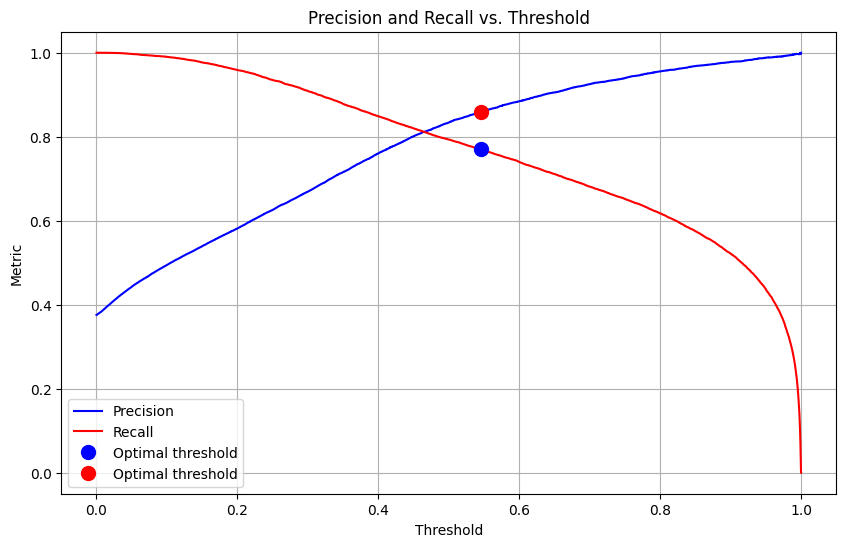

Informe de clasificación con umbral óptimo:
               precision    recall  f1-score   support

           0       0.87      0.92      0.90     24892
           1       0.86      0.77      0.81     14975

    accuracy                           0.87     39867
   macro avg       0.86      0.85      0.85     39867
weighted avg       0.87      0.87      0.86     39867

Matriz de confusión:
 [[22996  1896]
 [ 3433 11542]]
AUC-PR: 0.9103751366614161


In [32]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, recall_score, precision_recall_curve, auc
from xgboost import XGBClassifier

X_train, X_test, y_train, y_test = train_test_split(X_t1_reduced, y_t1, test_size=0.3, random_state=1451)

class_0_count = np.sum(y_train == 0).item()  
class_1_count = np.sum(y_train == 1).item()  
scale_pos_weight = class_0_count / class_1_count

print(f"scale_pos_weight calculado: {scale_pos_weight:.2f}")
model = XGBClassifier(objective='binary:logistic', 
                      eval_metric='logloss', 
                      random_state=100, 
                      scale_pos_weight=scale_pos_weight)

model.fit(X_train, y_train)

y_probs = model.predict_proba(X_test)[:, 1]  

precision, recall, thresholds = precision_recall_curve(y_test, y_probs)
auc_pr = auc(recall, precision)

print("AUC-PR:", auc_pr)

optimal_threshold_index = np.argmax(precision + recall)
optimal_threshold = thresholds[optimal_threshold_index]

print(f"Optimal threshold: {optimal_threshold:.2f}")
print(f"Precision: {precision[optimal_threshold_index]:.2f}")
print(f"Recall: {recall[optimal_threshold_index]:.2f}")
print(f"Sum: {precision[optimal_threshold_index] + recall[optimal_threshold_index]:.2f}")

plt.figure(figsize=(10, 6))
thresholds = thresholds.tolist() + [1]
plt.plot(thresholds, precision, label='Precision', color='blue')
plt.plot(thresholds, recall, label='Recall', color='red')
plt.plot(optimal_threshold, recall[optimal_threshold_index], 'bo', markersize=10, label='Optimal threshold')
plt.plot(optimal_threshold, precision[optimal_threshold_index], 'ro', markersize=10, label='Optimal threshold')
plt.xlabel('Threshold')
plt.ylabel('Metric')
plt.title('Precision and Recall vs. Threshold')
plt.legend()
plt.grid(True)
plt.show()

y_pred_adjusted = (y_probs > optimal_threshold).astype(int)
print("Informe de clasificación con umbral óptimo:\n", classification_report(y_test, y_pred_adjusted))
print("Matriz de confusión:\n", confusion_matrix(y_test, y_pred_adjusted))

precision, recall, _ = precision_recall_curve(y_test, y_probs)
auc_pr = auc(recall, precision)

print("AUC-PR:", auc_pr)


In [33]:
import mlflow
mlflow.set_tracking_uri(uri="http://127.0.0.1:5000") 
mlflow.set_experiment("XGBoost_Model_Experiment")

with mlflow.start_run():

    mlflow.log_metric("AUC-PR", auc_pr)


    mlflow.xgboost.log_model(model, artifact_path="model", registered_model_name="XGBoost_Model")

c:\Users\fcb11\LabProg\repo\.venv\Lib\site-packages\xgboost\core.py:158: UserWarning:

[17:50:43] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0c55ff5f71b100e98-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1374: Saving model in the UBJSON format as default.  You can use file extension: `json`, `ubj` or `deprecated` to choose between formats.

2024/12/12 17:50:51 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.
Registered model 'XGBoost_Model' already exists. Creating a new version of this model...
2024/12/12 17:50:51 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: XGBoost_Model, version 2


🏃 View run stylish-auk-317 at: http://127.0.0.1:5000/#/experiments/772164350729260887/runs/2454005eaea74ec1a6e492250ee3c90c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/772164350729260887


Created version '2' of model 'XGBoost_Model'.


In [34]:
from shap import TreeExplainer, LinearExplainer, summary_plot, waterfall_plot
from shap.plots import beeswarm

def explain_tree_model(model, X, instance_idx=0):   
    explainer = TreeExplainer(model)
    shap_values = explainer.shap_values(X)
    explanation = explainer(X)
    summary_plot(shap_values, X, plot_type='bar')
    beeswarm(explanation)

def explain_linear_model(model, X, instance_idx=0):
    explainer = LinearExplainer(model, X)
    shap_values = explainer.shap_values(X)
    explanation = explainer(X)
    summary_plot(shap_values, X, plot_type='bar')
    beeswarm(explanation)

c:\Users\fcb11\LabProg\repo\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



## Logistic Regresion

In [35]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score
from sklearn.impute import SimpleImputer


X_train, X_test, y_train, y_test = train_test_split(X_t1_reduced, y_t1, test_size=0.3, random_state=1451)

pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler()),  
    ('log_reg', LogisticRegression())
])

pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)

print("Classification Report:")
print(classification_report(y_test, y_pred))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

precision, recall, _ = precision_recall_curve(y_test, y_probs)
auc_pr = auc(recall, precision)
print("AUC-PR:", auc_pr)

c:\Users\fcb11\LabProg\repo\.venv\Lib\site-packages\sklearn\utils\validation.py:1339: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.88      0.83     24892
           1       0.76      0.59      0.66     14975

    accuracy                           0.77     39867
   macro avg       0.77      0.74      0.75     39867
weighted avg       0.77      0.77      0.77     39867

Confusion Matrix:
[[22020  2872]
 [ 6109  8866]]
AUC-PR: 0.9103751366614161


In [36]:
import mlflow
from mlflow.models import infer_signature

mlflow.set_tracking_uri(uri="http://127.0.0.1:5000")

mlflow.set_experiment("RegresionLogistica")

with mlflow.start_run():
    mlflow.log_metric("accuracy", accuracy_score(y_test, y_pred))
    mlflow.log_metric("auc_pr", auc_pr)

    mlflow.set_tag("Training Info", "Basic LR model")

    signature = infer_signature(X_train, pipeline.predict(X_train))

    model_info = mlflow.sklearn.log_model(
        sk_model=pipeline,
        artifact_path="model",
        signature=signature,
        input_example=X_train,
        registered_model_name="logistic_regression_model"
    )

Registered model 'logistic_regression_model' already exists. Creating a new version of this model...
2024/12/12 17:51:22 INFO mlflow.store.model_registry.abstract_store: Waiting up to 300 seconds for model version to finish creation. Model name: logistic_regression_model, version 3


🏃 View run kindly-foal-249 at: http://127.0.0.1:5000/#/experiments/134281302012701533/runs/a23ac9172c994e3981e5a2ce0f814868
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/134281302012701533


Created version '3' of model 'logistic_regression_model'.


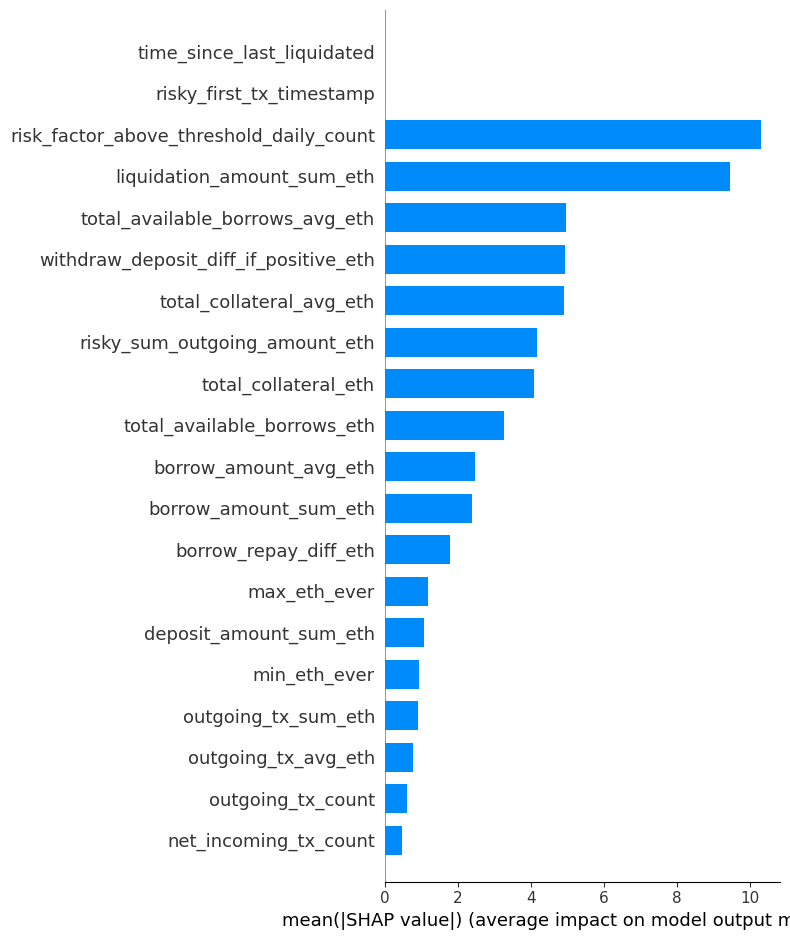

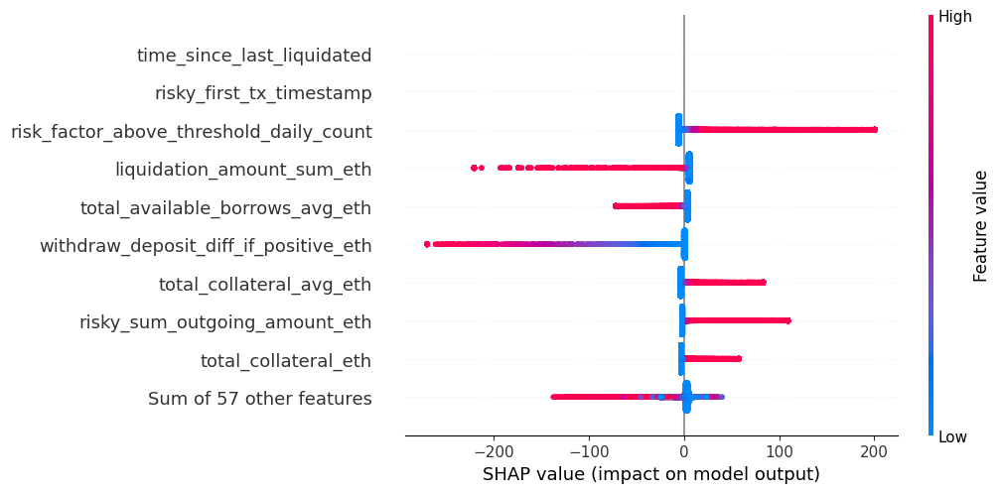

In [37]:
model = pipeline.named_steps['log_reg']

explain_linear_model(model, X_test)

In [38]:
import mlflow
import mlflow.sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import numpy as np

X_train, X_test, y_train, y_test = train_test_split(X_t1_reduced, y_t1, test_size=0.3, random_state=1451)

pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')), 
    ('scaler', StandardScaler()), 
    ('decision_tree', DecisionTreeClassifier(random_state=42))
])

pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)

print("Classification Report:")
print(classification_report(y_test, y_pred))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

precision, recall, _ = precision_recall_curve(y_test, y_probs)
auc_pr = auc(recall, precision)
print("AUC-PR:", auc_pr)

mlflow.set_tracking_uri("http://127.0.0.1:5000")
mlflow.set_experiment("DecisionTree_Model_Experiment")

with mlflow.start_run():

    mlflow.log_metric('accuracy', accuracy_score(y_test, y_pred))
    mlflow.log_metric('auc_pr', auc_pr)

    mlflow.set_tag("Training Info", "Basic Decision Tree model")

    signature = infer_signature(X_train, pipeline.predict(X_train))

    hyperparameters = {
        'criterion': 'gini',
        'max_depth': 5,
        'min_samples_split': 2,
        'random_state': 42
    }

    mlflow.log_params(hyperparameters)

    mlflow.sklearn.log_model(pipeline, artifact_path="model")



Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.85      0.85     24892
           1       0.75      0.76      0.76     14975

    accuracy                           0.82     39867
   macro avg       0.80      0.81      0.81     39867
weighted avg       0.82      0.82      0.82     39867

Confusion Matrix:
[[21134  3758]
 [ 3541 11434]]
AUC-PR: 0.9103751366614161


2024/12/12 17:51:42 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run funny-goat-901 at: http://127.0.0.1:5000/#/experiments/679121397693339857/runs/2032d8fe98d94549b22cf479a86da3f0
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/679121397693339857


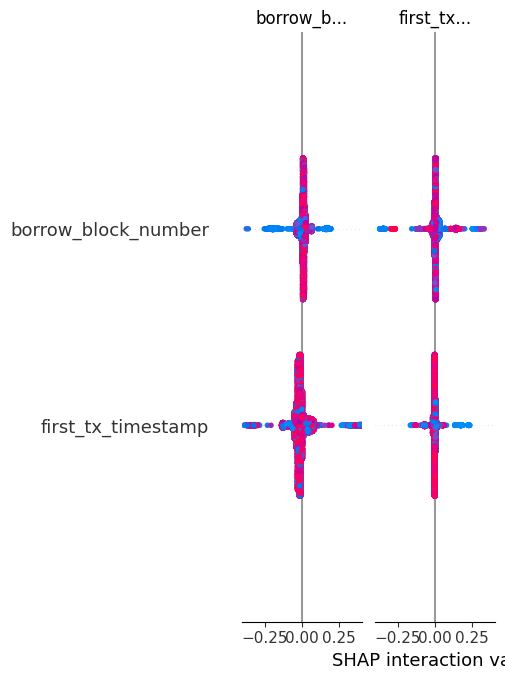

ValueError: The beeswarm plot does not support plotting explanations with instances that have more than one dimension!

# Optimizacion de parametros

In [86]:
import optuna
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import precision_recall_curve, auc

def objective(trial, model_name, X_train, y_train, X_test, y_test):
    max_estimators = 350
    max_max_depth = 12
    if model_name == 'XGBoost':
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, max_estimators),
            'max_depth': trial.suggest_int('max_depth', 9, max_max_depth),
            'learning_rate': trial.suggest_float('learning_rate', 0.0001, 0.2),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
            'gamma': trial.suggest_float('gamma', 0, 10),
        }
        model = xgb.XGBClassifier(**params, objective='binary:logistic', random_state=100)

        trial.set_user_attr('model_class', model_name)

    elif model_name == 'LightGBM':
        params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, max_estimators),
        'max_depth': trial.suggest_int('max_depth', 3, max_max_depth),
        'learning_rate': trial.suggest_float('learning_rate', 0.0001, 0.2),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0, 10),
        }

        model = LGBMClassifier(**params, random_state=100)

        trial.set_user_attr('model_class', model_name)

    elif model_name == 'RandomForest':
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 50, max_estimators),
            'max_depth': trial.suggest_int('max_depth', 3, max_max_depth),
            'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
            'max_features': trial.suggest_categorical('max_features', ['auto', 'sqrt', 'log2']),
        }
        model = RandomForestClassifier(**params, random_state=100)

        trial.set_user_attr('model_class', model_name)

    elif model_name == 'KNN':
        params = {
            'n_neighbors': trial.suggest_int('n_neighbors', 3, 15),
            'weights': trial.suggest_categorical('weights', ['uniform', 'distance']),
        }
        model = KNeighborsClassifier(**params)

        trial.set_user_attr('model_class', model_name)
    else:
        raise ValueError("Invalid model name")

    model.fit(X_train, y_train)
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_proba)
    auc_pr = auc(recall, precision)

    return auc_pr


models = [ 'XGBoost']
studies = []
for model_name in models:
    study = optuna.create_study(direction='maximize')
    study.optimize(lambda trial: objective(trial, model_name, X_train, y_train, X_test, y_test), n_trials=30, n_jobs=8, gc_after_trial=True)
    studies.append(study)

[I 2024-12-12 17:15:50,136] A new study created in memory with name: no-name-1da8ad5c-48b7-4616-b85e-3b2db34921d2
[I 2024-12-12 17:16:12,221] Trial 6 finished with value: 0.8946974558975166 and parameters: {'n_estimators': 259, 'max_depth': 9, 'learning_rate': 0.17752177924387202, 'subsample': 0.9209523184756343, 'colsample_bytree': 0.8537930681245545, 'min_child_weight': 4, 'gamma': 8.942839073554605}. Best is trial 6 with value: 0.8946974558975166.
[I 2024-12-12 17:16:28,174] Trial 3 finished with value: 0.875057461144375 and parameters: {'n_estimators': 100, 'max_depth': 11, 'learning_rate': 0.011185378432172417, 'subsample': 0.702532456473218, 'colsample_bytree': 0.9086047090600069, 'min_child_weight': 6, 'gamma': 9.337815752466557}. Best is trial 6 with value: 0.8946974558975166.
[I 2024-12-12 17:16:35,800] Trial 0 finished with value: 0.9317461956568276 and parameters: {'n_estimators': 156, 'max_depth': 12, 'learning_rate': 0.1968961034497788, 'subsample': 0.9878107022619707, 'co

In [87]:
models_classes = {
    'XGBoost': xgb.XGBClassifier
}

In [88]:
best_metric = float('-inf')
for study in studies:
    if study.best_value > best_metric:
        best_metric = study.best_value
        best_class_name = study.best_trial.user_attrs['model_class']
        best_params = study.best_params
        best_model = models_classes[best_class_name](**best_params, random_state=100)

print(f"Best model class: {best_class_name}")
print(f"Best metric achieved: {best_metric:.4f}")
print("Best parameters:")
print(best_params)
best_model.fit(X_train, y_train)
    

Best model class: XGBoost
Best metric achieved: 0.9382
Best parameters:
{'n_estimators': 333, 'max_depth': 11, 'learning_rate': 0.06807083183544688, 'subsample': 0.996554938052552, 'colsample_bytree': 0.5184609851505608, 'min_child_weight': 6, 'gamma': 0.1000868659353098}


XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.5184609851505608, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.1000868659353098,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.06807083183544688,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=11, max_leaves=None,
              min_child_weight=6, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=333, n_jobs=None,
              num_parallel_tree=None, random_state=100, ...)

In [89]:
import mlflow
import mlflow.sklearn

best_metric = float('-inf')

mlflow.set_experiment("Model_Optimization_Experiment")

for study in studies:
    if study.best_value > best_metric:
        best_metric = study.best_value
        best_class_name = study.best_trial.user_attrs['model_class']
        best_params = study.best_params
        best_model = models_classes[best_class_name](**best_params, random_state=100)
        
        with mlflow.start_run():
            mlflow.log_param("model_class", best_class_name)
            for param, value in best_params.items():
                mlflow.log_param(param, value)
            
            mlflow.log_metric("best_metric", best_metric)
            
            best_model.fit(X_train, y_train)
            
            y_pred = best_model.predict(X_test)
            accuracy = accuracy_score(y_test, y_pred)
            mlflow.log_metric("accuracy", accuracy)
            
            mlflow.sklearn.log_model(best_model, "best_model")

print(f"Best model class: {best_class_name}")
print(f"Best metric achieved: {best_metric:.4f}")
print("Best parameters:")
print(best_params)


2024/12/12 17:18:46 INFO mlflow.tracking.fluent: Experiment with name 'Model_Optimization_Experiment' does not exist. Creating a new experiment.
2024/12/12 17:19:03 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


🏃 View run respected-toad-7 at: http://127.0.0.1:5000/#/experiments/445491400663982097/runs/e37c404e23494f51acd4ece58729b9d0
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/445491400663982097
Best model class: XGBoost
Best metric achieved: 0.9382
Best parameters:
{'n_estimators': 333, 'max_depth': 11, 'learning_rate': 0.06807083183544688, 'subsample': 0.996554938052552, 'colsample_bytree': 0.5184609851505608, 'min_child_weight': 6, 'gamma': 0.1000868659353098}


Best model class: XGBoost
Best metric achieved: 0.9354
Best parameters:
{'n_estimators': 164, 'max_depth': 14, 'learning_rate': 0.12783538895145963, 'subsample': 0.6820656987930516, 'colsample_bytree': 0.6691042298335605, 'min_child_weight': 8, 'gamma': 0.07253741103082789}

In [90]:
X_t1_reduced.shape, X_t2_reduced.shape

((132888, 66), (177184, 66))

In [91]:
best_model.predict_proba(X_t2_reduced)

array([[0.04134423, 0.9586558 ],
       [0.01264614, 0.98735386],
       [0.02360326, 0.97639674],
       ...,
       [0.79284406, 0.20715597],
       [0.8029983 , 0.19700168],
       [0.01839912, 0.9816009 ]], dtype=float32)

In [92]:
from zipfile import ZipFile
import os
def generateFiles(predict_data, clf_pipe):
    """Genera los archivos a subir en CodaLab

    Input
    ---------------
    predict_data: Dataframe con los datos de entrada a predecir
    clf_pipe: pipeline del clf

    Ouput
    ---------------
    archivo de txt
    """
    y_pred_clf = clf_pipe.predict_proba(predict_data)[:, 1]
    with open('./predictions.txt', 'w') as f:
        for item in y_pred_clf:
            f.write("%s\n" % item)

    with ZipFile('predictions.zip', 'w') as zipObj:
        zipObj.write('predictions.txt')
    os.remove('predictions.txt')

generateFiles(X_t2_reduced, best_model)